In [ ]:
import pandas as pd
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import pystac_client
import os
from tqdm import tqdm
from odc.stac import stac_load
import glob
import xarray as xr
import planetary_computer as pc
from scipy.signal import savgol_filter
from matplotlib import dates
import datetime
from matplotlib.patches import Patch
from os.path import sep
import re

import warnings
warnings.filterwarnings('ignore')

### Helper functions

In [ ]:
def extract_latlong(latlong):
    """Extract latitude & longitude from the Crop_Location_Data_20221201.csv"""
    latitude,longitude = latlong.replace('(','').replace(')','').replace(' ','').split(',')
    latitude,longitude = float(latitude),float(longitude)
    return latitude,longitude

extract_latlong_v = np.vectorize(extract_latlong) # to avoid using for loop

def l1_data_loader():
    """
    1. Load Crop_Location_Data_20221201.csv and convert to GeoDataFrame for convenience.
    2. Cluster into 7 groups of data point.
    """
    data = pd.read_csv("data/Crop_Location_Data_20221201.csv")
    data['latitude'],data['longitude'] = extract_latlong_v(data['Latitude and Longitude'].values)
    data = gpd.GeoDataFrame(data,
                            crs="EPSG:4326",
                            geometry=[Point(extract_latlong(ll)[1],extract_latlong(ll)[0]) for ll in data['Latitude and Longitude'].values])

    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(data[['latitude','longitude']])
    km = KMeans(n_clusters=7,random_state=42)
    y_predicted = km.fit_predict(scaled)
    data['grouping'] = y_predicted
    return data

def l1_template_loader():
    """
    1. Load challenge_1_submission_template_correct_columns_fixed.csv and convert to GeoDataFrame for convenience.
    2. Cluster into 6 groups of data point.
    """
    data = pd.read_csv("submission/challenge_1_submission_template_correct_columns_fixed.csv")
    data['latitude'],data['longitude'] = extract_latlong_v(data['id'].values)
    data = gpd.GeoDataFrame(data,
                            crs="EPSG:4326",
                            geometry=[Point(extract_latlong(ll)[1],extract_latlong(ll)[0]) for ll in data['id'].values])
    
    scaler = MinMaxScaler()

    scaled = scaler.fit_transform(data[['latitude','longitude']])
    km = KMeans(n_clusters=6,random_state=42)
    y_predicted = km.fit_predict(scaled)
    data['grouping'] = y_predicted
    return data

def degree_per_pixel(meter_per_pixel):
    """Convert meter to pixel to degree per pixel"""
    return meter_per_pixel / 111320.0 # degrees per pixel for CRS:4326

def get_bounds(df,criteria,meter_per_pixel=None,pixel_pad=5):
    """get the minx, miny, maxx, & maxy of the df with padding"""
    left_id = df[df.longitude == df[criteria].longitude.min()].index[0]
    bottom_id = df[df.latitude == df[criteria].latitude.min()].index[0]
    right_id = df[df.longitude == df[criteria].longitude.max()].index[0]
    top_id = df[df.latitude == df[criteria].latitude.max()].index[0]
    minx,miny,maxx,maxy = (df.loc[left_id].longitude,df.loc[bottom_id].latitude,
                    df.loc[right_id].longitude,df.loc[top_id].latitude)

    padding = pixel_pad * degree_per_pixel(meter_per_pixel)
    return minx-padding,miny-padding,maxx+padding,maxy+padding

def get_square_bounds(df,criteria,meter_per_pixel=None,pixel_pad=3):
    """get the square minx, miny, maxx, & maxy of the df with padding"""
    left_id = df[df.longitude == df[criteria].longitude.min()].index[0]
    bottom_id = df[df.latitude == df[criteria].latitude.min()].index[0]
    right_id = df[df.longitude == df[criteria].longitude.max()].index[0]
    top_id = df[df.latitude == df[criteria].latitude.max()].index[0]
    minx,miny,maxx,maxy = (df.loc[left_id].longitude,df.loc[bottom_id].latitude,
                    df.loc[right_id].longitude,df.loc[top_id].latitude)
    dpp = degree_per_pixel(meter_per_pixel)
    padding = pixel_pad * dpp
    # if horizontal is larger than vertical divide half and add top bottom
    horiz_px = (abs(maxx - minx))/dpp
    vert_px = (abs(maxy - miny))/dpp

    if horiz_px > vert_px:
        miny -= ((horiz_px-vert_px)//2) * dpp
        maxy += ((horiz_px-vert_px)//2 + (horiz_px-vert_px)%2) * dpp
    elif vert_px > horiz_px:
        minx -= ((vert_px-horiz_px)//2) * dpp
        maxx += ((vert_px-horiz_px)//2 + (vert_px-horiz_px)%2) * dpp

    return minx-padding,miny-padding,maxx+padding,maxy+padding

# 1. Visualize Data

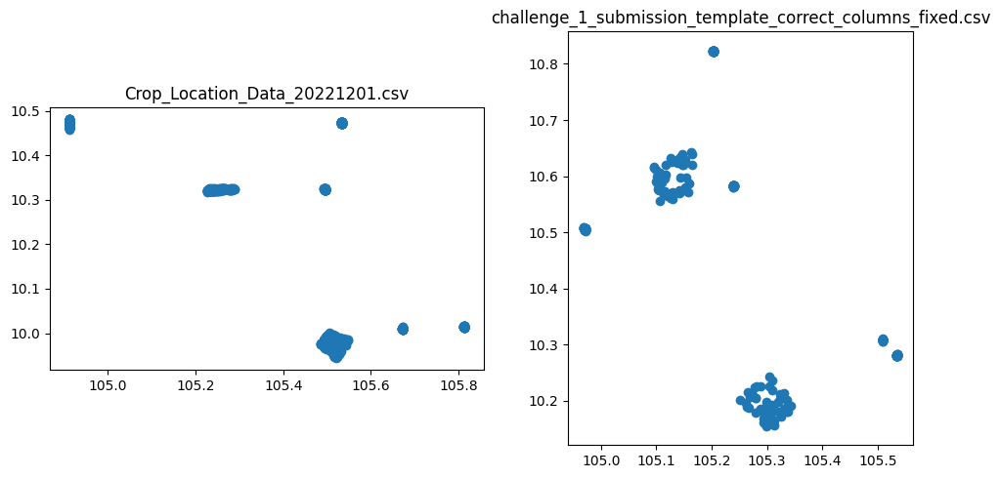

In [ ]:
l1_data = l1_data_loader()
l1_temp = l1_template_loader()

fig,ax = plt.subplots(1,2,figsize=(10,5))
l1_data.plot(ax=ax[0])
ax[0].set_title("Crop_Location_Data_20221201.csv")
l1_temp.plot(ax=ax[1])
ax[1].set_title("challenge_1_submission_template_correct_columns_fixed.csv")
plt.tight_layout()
plt.show()

# 2. Cluster data points
### Why Cluster?

- Data point were grouped into clusters to allow downloading smaller bounding box areas.
- Save disk space.
- Faster downloading time.
- Avoid "One" big download that may cause "One" big failed download if network fail.

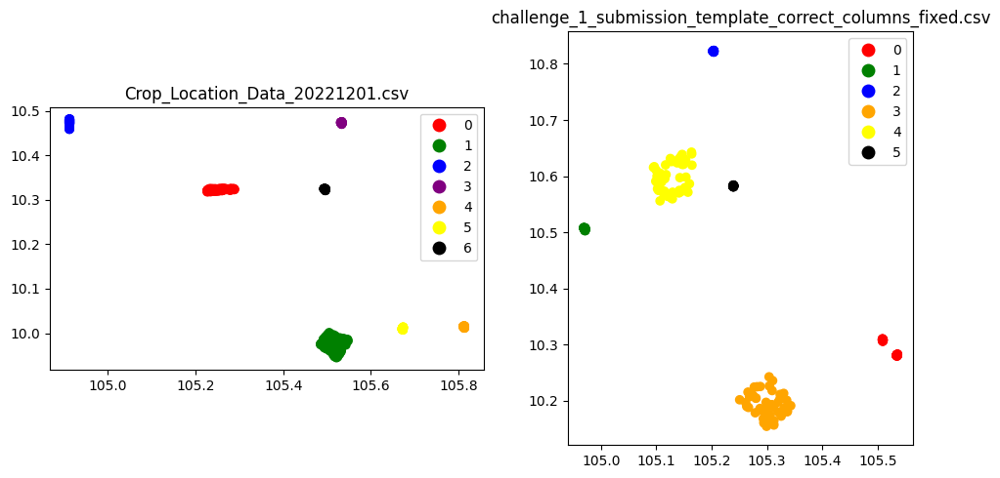

In [ ]:
fig,ax = plt.subplots(1,2,figsize=(10,5))
my_colors = ['r','g','b','purple','orange','yellow','black']
my_cmap = colors.ListedColormap(my_colors)
l1_data.plot(ax=ax[0],column='grouping',cmap=my_cmap,categorical=True,legend=True)
ax[0].set_title("Crop_Location_Data_20221201.csv")
l1_temp.plot(ax=ax[1],column='grouping',cmap=my_cmap,categorical=True,legend=True)
ax[1].set_title("challenge_1_submission_template_correct_columns_fixed.csv")
plt.tight_layout()
plt.show()

# 3. Download to NetCDF file
Download group by group for all the chosen dates for all coordinates in "Crop_Location_Data_20221201.csv" & "challenge_1_submission_template_correct_columns_fixed.csv"
- Sentinel-2 : download selected scenes on the data
- Sentinal-1 : download scenes with nearest dates with Sentinel-2

### 3.1 Find items (scenes)

In [ ]:
def get_items(l1_data,time_slice,padding=3,platform=None,collections=None,meters_per_pixel=10,query=None):
    if not query:
        query = {"platform": {"in": [platform,]},}
    catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
    # find the west most group in the map
    # for sentinel-2 data it is found that the west most group of datapoint are not in the same scenes with others
    westmost_group = l1_data[l1_data.longitude == l1_data.longitude.min()].head(1)['grouping'].values[0]
    eastmost_group = l1_data[l1_data.longitude == l1_data.longitude.max()].head(1)['grouping'].values[0]
    ## West side
    criteria = l1_data['grouping'] == westmost_group
    left_id = l1_data[l1_data.longitude == l1_data[criteria].longitude.min()].index[0]
    bottom_id = l1_data[l1_data.latitude == l1_data[criteria].latitude.min()].index[0]
    right_id = l1_data[l1_data.longitude == l1_data[criteria].longitude.max()].index[0]
    top_id = l1_data[l1_data.latitude == l1_data[criteria].latitude.max()].index[0]
    minx,miny,maxx,maxy = (l1_data.loc[left_id].longitude,l1_data.loc[bottom_id].latitude,
                    l1_data.loc[right_id].longitude,l1_data.loc[top_id].latitude)
    padding = padding * degree_per_pixel(meters_per_pixel) # pad with 
    minx,miny,maxx,maxy = minx-padding,miny-padding,maxx+padding,maxy+padding
    # search items in catalog
    search = catalog.search(
                collections=collections,
                bbox=(minx,miny,maxx,maxy),
                datetime=time_slice,
                query=query)
    west_items = search.get_all_items()
    print("West items count:",len(west_items))
    ## East side
    criteria = l1_data['grouping'] == eastmost_group # use group 2 as the reference scenes for all rightside of the map
    left_id = l1_data[l1_data.longitude == l1_data[criteria].longitude.min()].index[0]
    bottom_id = l1_data[l1_data.latitude == l1_data[criteria].latitude.min()].index[0]
    right_id = l1_data[l1_data.longitude == l1_data[criteria].longitude.max()].index[0]
    top_id = l1_data[l1_data.latitude == l1_data[criteria].latitude.max()].index[0]
    minx,miny,maxx,maxy = (l1_data.loc[left_id].longitude,l1_data.loc[bottom_id].latitude,
                    l1_data.loc[right_id].longitude,l1_data.loc[top_id].latitude)
    padding = 3 * degree_per_pixel(meters_per_pixel) # pad with 
    minx,miny,maxx,maxy = minx-padding,miny-padding,maxx+padding,maxy+padding
    # search items in catalog
    search = catalog.search(
                collections=collections,
                bbox=(minx,miny,maxx,maxy),
                datetime=time_slice,
                query=query)
    east_items = search.get_all_items()
    print("East items count:",len(east_items))
    return westmost_group,eastmost_group,west_items,east_items

### 3.2 Download data based on the available items

In [ ]:
pc.settings.set_subscription_key(API_KEY)

def download_data(l1_data,time_slice,westmost_group,west_items,east_items,bands,gsd,download_folder=DOWNLOAD_FOLDER,collection=COLLECTION,square=True):
    newpath = f"{os.path.join(download_folder,collection.upper(),time_slice.split('/')[0])}"
    if not os.path.exists(newpath):
        os.makedirs(newpath)

    for i in tqdm(l1_data.grouping.unique(),desc="Download data"):
        _items = east_items # by default choose east items
        if i == westmost_group: # if the group is the most west group then use west items
            _items = west_items
        
        # this is for a very specific case on this specific date...whereby there are 2 items during that day
        if time_slice == '2021-12-06/2021-12-07':
            _items = [_items[1]] # choose the second one

        criteria = l1_data['grouping'] == i
        minx,miny,maxx,maxy = get_bounds(l1_data,criteria,meter_per_pixel=gsd,pixel_pad=PIXEL_PAD)
        if square:
            minx,miny,maxx,maxy = get_square_bounds(l1_data,criteria,meter_per_pixel=gsd,pixel_pad=PIXEL_PAD)
        # the actual function that download the data into xarray
        xx = stac_load(
                    _items,
                    bands=bands,
                    crs="EPSG:4326", # WGS84 -> Latitude-Longitude
                    resolution=degree_per_pixel(gsd), # resolution in Degrees
                    chunks={"x": 30, "y": 30}, # small chunks can be faster for download
                    patch_url=pc.sign,
                    bbox=(minx,miny,maxx,maxy))
        
        xx.to_netcdf(os.path.join(newpath,f"group_{gsd}_{i}.nc"))

    return newpath,xx

### 3.3 Downloading main function

In [ ]:
def download_day_by_day():
    """Download data day by day group by group.
    By doing this can split data download smaller
    and if any network failure can start in the middle
    instead of downloading all at once."""
    # Sentinel-2 gsd resolutions with the available bands for download
    gsd_bands = {
        10:['AOT','B02','B03','B04','B08','WVP','visual'],
        20:['B05','B06','B07','B11','B12','B8A','SCL'],
        60:['B01','B09']}
    
    l1_data = l1_data_loader() # load Crop_Location_Data_20221201.csv
    print("L1 data loaded")

    # these time slices are for sentinel-2
    time_slices = [
        '2021-02-19/2021-02-20',
        '2021-02-09/2021-02-10',
        "2021-03-01/2021-03-02",
        "2021-03-11/2021-03-12",
        "2021-03-21/2021-03-22",
        "2021-03-31/2021-04-01",  
        '2021-08-28/2021-08-29',
        '2021-08-18/2021-08-19',
        '2021-08-08/2021-08-09',
        '2021-12-26/2021-12-27',
        '2021-12-16/2021-12-17',
        '2021-12-06/2021-12-07'
    ]

    for time_slice in time_slices:
        print(f"START TIME SLICE: {time_slice}")
        
        # Find available items
        westmost_group,_,west_items,east_items = get_items(l1_data,time_slice,padding=5,platform=PLATFORM,collections=[COLLECTION])

        # Download data
        for gsd in gsd_bands:
            bands = gsd_bands[gsd]

            newpath,_ = download_data(l1_data,time_slice,westmost_group,west_items,east_items,bands,gsd)
            print(f"Data downloaded in {newpath}")

        print("FINISH!")

# 4. Extract data from from netCDF
The output were saved to Pandas DataFrame and Excel sheet

### 4.1 Get pixel value

In [ ]:
def get_value(band,latitude,longitude,xrdataset):
    """Get value of specific band at specific coordinates from the xarray dataset"""
    lat_id = np.argmin(np.abs(xrdataset.latitude - latitude),keepdims=True).values[0]
    long_id = np.argmin(np.abs(xrdataset.longitude - longitude),keepdims=True).values[0]
    return xrdataset[band].isel(longitude=long_id,latitude=lat_id).values[0]
    
def get_list_values(band,l1_data,xrdatasets):
    """Get values for every coordinates in the Crop_Location_Data_20221201.csv"""
    vals = []
    for _,(lat,long,group) in l1_data[['latitude','longitude','grouping']].iterrows():
        vals.append(get_value(band,lat,long,xrdatasets[group]))
    return vals

def extract_pixel_then_merge(ncpath,l1_data,bands,gsd=None):
    
    file_paths = glob.glob(f"{ncpath}/*.nc")
    if gsd:
        file_paths = glob.glob(f"{ncpath}/*_{gsd}_*.nc")
    xrdatasets = {}
    for file_path in file_paths:
        group = int(file_path[-4])
        xrdatasets[group] = xr.open_dataset(file_path) 

    for band in tqdm(bands,desc="extract pixel"):
        l1_data[band] = get_list_values(band,l1_data,xrdatasets)
    
    return l1_data

### 4.2 Get windows of pixels values

In [ ]:
def get_window_array(band,latitude,longitude,xrdataset,window=None):
    lat_id = np.argmin(np.abs(xrdataset.latitude - latitude),keepdims=True).values[0]
    long_id = np.argmin(np.abs(xrdataset.longitude - longitude),keepdims=True).values[0]
    min_lat = lat_id - window//2
    max_lat =  lat_id + window//2 + 1
    min_long = long_id - window//2
    max_long = long_id + window//2 + 1
    return xrdataset[[band]].to_array()[:,:,min_lat:max_lat,min_long:max_long].values[0][0]

def get_list_window_arrays(band,l1_data,xrdatasets,window):
    vals = []
    for _,(lat,long,group) in l1_data[['latitude','longitude','grouping']].iterrows():
        vals.append(get_window_array(band,lat,long,xrdatasets[group],window=window))
    return vals

def extract_window_then_merge(ncpath,l1_data,bands,window,gsd=None):
    file_paths = glob.glob(f"{ncpath}/*.nc")
    if gsd:
        file_paths = glob.glob(f"{ncpath}/*_{gsd}_*.nc")
    xrdatasets = {}
    for file_path in file_paths:
        group = int(file_path[-4])
        xrdatasets[group] = xr.open_dataset(file_path) 

    for band in tqdm(bands,desc="extract window"):
        column_name = f"{band}_w{window}"
        l1_data[column_name] = get_list_window_arrays(band,l1_data,xrdatasets,window=window)
    
    return l1_data

### 4.3 Persist DataFrame to pickle and Excel

In [ ]:
def persist_final_df(folder,time_slice,l1_data,prefix=PREFIX,collection=COLLECTION):
    if not os.path.exists(folder):
        os.makedirs(folder)
        
    l1_data.to_pickle(f"{folder}/{prefix}_{collection.upper()}_{time_slice.split('/')[0]}.pkl")
    l1_data.to_excel(f"{folder}/{prefix}_{collection.upper()}_{time_slice.split('/')[0]}.xlsx")

### 4.4 Extraction

In [ ]:
def extract_day_by_day():
    # these are gsd and bands for sentinel-2 data
    gsd_bands = {
        10:['AOT','B02','B03','B04','B08','WVP','visual'],
        20:['B05','B06','B07','B11','B12','B8A','SCL'],
        60:['B01','B09']}
    
    l1_data = l1_data_loader()
    print("L1 data loaded")

    time_slices = [
        '2021-02-19/2021-02-20',
        '2021-02-09/2021-02-10',
        "2021-03-01/2021-03-02",
        "2021-03-11/2021-03-12",
        "2021-03-21/2021-03-22",
        "2021-03-31/2021-04-01",  
        '2021-08-28/2021-08-29',
        '2021-08-18/2021-08-19',
        '2021-08-08/2021-08-09',
        '2021-12-26/2021-12-27',
        '2021-12-16/2021-12-17',
        '2021-12-06/2021-12-07'
    ]

    for time_slice in time_slices:
        print(f"START TIME SLICE: {time_slice}")

        for gsd in gsd_bands:
            bands = gsd_bands[gsd]

            newpath = f"{os.path.join(DOWNLOAD_FOLDER,COLLECTION.upper(),time_slice.split('/')[0])}"

            l1_data = extract_pixel_then_merge(newpath,l1_data,bands)
            l1_data = extract_window_then_merge(newpath,l1_data,bands,window=9)
            print("Downloaded data merged with L1 data")
            
        persist_final_df(READY_DATASET_FOLDER,time_slice,l1_data)
        print("FINISH!")

# 5 Other related processes
## 5.1 NDVI throughout the year
Chose which months with most variance between cluster data points. The logic is, if there are more variance of NDVI between group, meaning that more differentiable

### 5.1.1 Download

In [ ]:
def download_multiitems_data(l1_data,time_slice,westmost_group,west_items,east_items,bands,gsd,group):
    """Returns Xarray datasets
    """
    newpath = f"{os.path.join(DOWNLOAD_FOLDER,COLLECTION.upper(),time_slice.split('/')[0])}"
    if not os.path.exists(newpath):
        os.makedirs(newpath)

    _items = east_items
    if group == westmost_group:
        _items = west_items
    
    criteria = l1_data['grouping'] == group
    minx,miny,maxx,maxy = get_square_bounds(l1_data,criteria,meter_per_pixel=gsd)
    xx = stac_load(
                _items,
                # groupby='solar_day',
                bands=bands,
                crs="EPSG:4326", # Latitude-Longitude
                resolution=degree_per_pixel(gsd), # Degrees
                chunks={"x": 30, "y": 30}, # using smaller chunks improve download speed
                patch_url=pc.sign,
                bbox=(minx,miny,maxx,maxy),
                progress=tqdm)

    xx.to_netcdf(os.path.join(newpath,f"multiitems_{time_slice}_{gsd}_{group}.nc"),engine="h5netcdf",invalid_netcdf=True)
    print(f"Files downloaded to {newpath}")
    return newpath,xx

def download_all_year_for_ndvi(year):
    gsd_bands = {
        10:['B04','B08'],}
    
    l1_data = l1_data_loader()
    print("L1 data loaded")

    time_slice = f'{year}'

    westmost_group,_,west_items,east_items = get_items(l1_data,time_slice,padding=5,platform=PLATFORM,collections=[COLLECTION])
    gsd = 10
    bands = gsd_bands[gsd]
    for group in [0]:
        print(f"Start Download {time_slice=} {gsd=} {bands=} {group=}")
        newpath,xx = download_multiitems_data(l1_data,time_slice,westmost_group,west_items,east_items,bands,gsd,group)
        print("FINISH")

### 5.1.2 Plot all groups throughout the year
Only done on training data

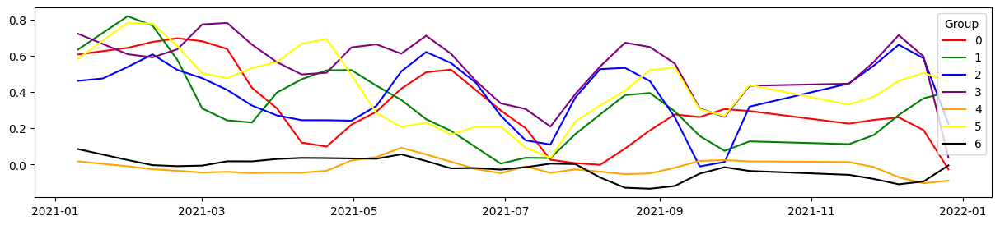

In [ ]:
files2021 = glob.glob("group_data_6_ndvi_analysis/SENTINEL-2-L2A/2021/*.nc")[:]
dfs = []
fig,ax = plt.subplots(figsize=(15,3))
my_colors = ['r','g','b','purple','orange','yellow','black']
for file in files2021:
    group = int(file[-4])
    x0 = xr.open_dataset(file)
    nirs = x0['B08'].mean(['latitude','longitude'])
    reds = x0['B04'].mean(['latitude','longitude'])
    ndvis = (nirs - reds)/(nirs + reds)
    x = ndvis.time
    y = savgol_filter(ndvis,8,3)
    df = pd.DataFrame(y,x,columns=[group])
    dfs.append(df)
    line, = ax.plot(x,y,c=my_colors[group])
    line.set_label(group)
ax.legend(title="Group")
plt.show()

### 5.1.3 Highlight months with most variance

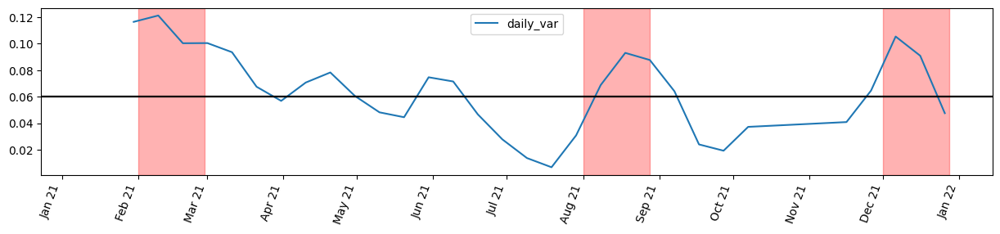

In [ ]:
df_ndvis = pd.concat(dfs,axis=1)
df_ndvis['daily_var'] = df_ndvis.var(axis=1)
dt = np.diff(df_ndvis.index)
dvar = np.diff(df_ndvis.daily_var)

fig, ax = plt.subplots(figsize=(15,3))
df_ndvis[['daily_var']].plot(ax=ax)
ax.xaxis.set_major_locator(dates.MonthLocator(interval=1))
ax.xaxis.set_major_formatter(dates.DateFormatter('%b %y'))
# ax.grid(True)
for i in [2,8,12]:
    plt.axvspan(datetime.datetime(2021,i,1), datetime.datetime(2021,i,28), color='red', alpha=0.3)
    ax.axhline(0.06,c='black')
labels = ax.get_xticklabels()
plt.setp(labels, rotation=70, fontsize=10)
plt.show()

## 5.2 Find scenes throughout the year with least cloud
This is as additional scenes to the above (months with most variance). Ignored if the scenes are the same as previous.

### 5.2.1 Find all available scenes in 2021

In [ ]:
l1_data = l1_data_loader()
# find for "Sentinel-2A"
westmost_group,eastmost_group,west_itemsa,east_itemsa = get_items(l1_data,'2021',5,"Sentinel-2A",['sentinel-2-l2a'])
# find for "Sentinel-2B"
westmost_groupb,eastmost_groupb,west_itemsb,east_itemsb = get_items(l1_data,'2021',5,"Sentinel-2B",['sentinel-2-l2a'])

West items count: 34
East items count: 33
West items count: 35
East items count: 35


### 5.2.2 Transform to Pandas Dataframe

In [ ]:
def to_dataframe(itemsa,itemsb):
    dfs = []
    for item in  itemsa.items:
        dfs.append(pd.DataFrame(item.properties))

    for item in  itemsb.items:
        dfs.append(pd.DataFrame(item.properties))

    df = pd.concat(dfs)
    df['datetext'] = df['datetime'].str[:10]
    df['datetime'] = pd.to_datetime(df['datetime'])
    return df

df_west = to_dataframe(west_itemsa,west_itemsb)
df_east = to_dataframe(east_itemsa,east_itemsb)
df_west.shape,df_east.shape

((69, 34), (68, 34))

### 5.2.3 Visualize throughout the year 2021

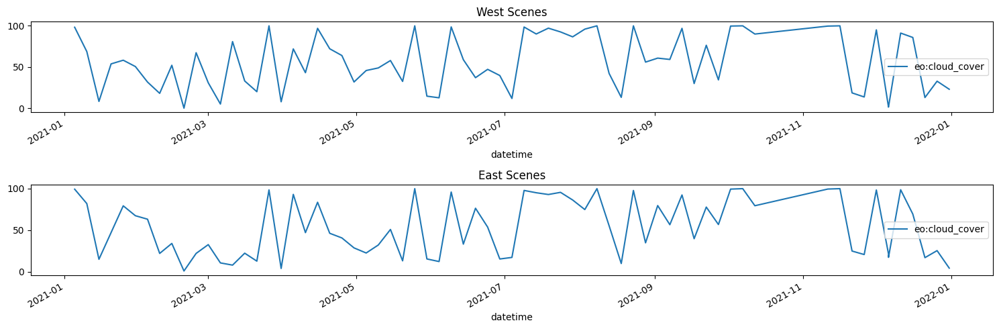

In [ ]:
fig,ax = plt.subplots(2,1,figsize=(15,5))
df_west[['datetime','eo:cloud_cover']].set_index('datetime').plot(ax=ax[0])
ax[0].set_title("West Scenes")
df_east[['datetime','eo:cloud_cover']].set_index('datetime').plot(ax=ax[1])
ax[1].set_title("East Scenes")
plt.tight_layout()
plt.show()

### 5.2.3 Select less than 15% cloud cover
East side scenes contains most of the data groups (i.e. 6 of 7 in the east), therefore east side will be use as the primary.

In [ ]:
east_selected = df_east[df_east['eo:cloud_cover']<15][['datetime','datetext','platform','eo:cloud_cover','s2:product_uri']].groupby('datetime').min()
east_uris = east_selected['s2:product_uri'].values.tolist()
east_uris

['S2B_MSIL2A_20210115T032059_N0212_R118_T48PWS_20210115T155106.SAFE',
 'S2A_MSIL2A_20210219T031751_N0212_R118_T48PWS_20210219T201138.SAFE',
 'S2B_MSIL2A_20210306T031609_N0212_R118_T48PWS_20210307T002941.SAFE',
 'S2A_MSIL2A_20210311T031541_N0212_R118_T48PWS_20210311T203944.SAFE',
 'S2A_MSIL2A_20210321T031541_N0212_R118_T48PWS_20210321T231704.SAFE',
 'S2A_MSIL2A_20210331T031541_N0212_R118_T48PWS_20210331T141331.SAFE',
 'S2A_MSIL2A_20210520T031541_N0212_R118_T48PWS_20210521T042023.SAFE',
 'S2B_MSIL2A_20210604T031539_N0212_R118_T48PWS_20210604T173641.SAFE',
 'S2A_MSIL2A_20210818T031541_N0300_R118_T48PWS_20210818T172954.SAFE',
 'S2B_MSIL2A_20211231T032129_N0300_R118_T48PWS_20220101T020052.SAFE']

Dates found for east sides scenes will be used to find the west side scenes.

In [ ]:
west_same_dates = df_west[df_west['datetext'].isin(east_selected['datetext'].values)]
west_same_dates = west_same_dates[['datetime','datetext','platform','eo:cloud_cover','s2:product_uri']]
west_selected = west_same_dates.groupby('datetime').min()
west_uris = west_selected['s2:product_uri'].values.tolist()
west_uris

['S2B_MSIL2A_20210115T032059_N0212_R118_T48PVS_20210115T155322.SAFE',
 'S2A_MSIL2A_20210219T031751_N0212_R118_T48PVS_20210219T200125.SAFE',
 'S2B_MSIL2A_20210306T031609_N0212_R118_T48PVS_20210306T231837.SAFE',
 'S2A_MSIL2A_20210311T031541_N0212_R118_T48PVS_20210311T205905.SAFE',
 'S2A_MSIL2A_20210321T031541_N0212_R118_T48PVS_20210321T230022.SAFE',
 'S2A_MSIL2A_20210331T031541_N0212_R118_T48PVS_20210331T134324.SAFE',
 'S2A_MSIL2A_20210520T031541_N0212_R118_T48PVS_20210521T022542.SAFE',
 'S2B_MSIL2A_20210604T031539_N0212_R118_T48PVS_20210604T175903.SAFE',
 'S2A_MSIL2A_20210818T031541_N0300_R118_T48PVS_20210818T182224.SAFE',
 'S2B_MSIL2A_20211231T032129_N0300_R118_T48PVS_20220101T005710.SAFE']

## 5.3 Cloud Analysis
Visually inspect each of the location for clouds

### 5.3.1 Plotting Function

In [ ]:
def plot_cloud_cover(root_folder,l1_data,groupcount,to_png=None):
    # Filter data using the Sentinel-2 SCL band classification
    # scl=8 > Cloud Medium Probability 
    # scl=9 > Cloud High Probability
    CLOUDSCL = [8,9]

    if isinstance(root_folder,list):
        folders = []
        for folder in root_folder:
            folders.extend(glob.glob(f"{folder}/*"))
        no_of_days = len(folders)
    elif isinstance(root_folder,str):
        no_of_days = len(glob.glob(f"{root_folder}/*"))

    fig_width = groupcount * 3
    fig_height = no_of_days * 3
    fig,ax = plt.subplots(no_of_days,groupcount,figsize=(fig_width,fig_height))
    cloud_sums = []
    for group in range(groupcount):
        # Load netCDF data from disk
        if isinstance(root_folder,list):
            files10,files20 = [],[]
            for folder in root_folder:
                files10.extend(glob.glob(f"{folder}/*/group_10_{group}.nc"))
                files20.extend(glob.glob(f"{folder}/*/group_20_{group}.nc"))
            files10 = sorted(files10,key=lambda x:x.split(sep)[-2])
            files20 = sorted(files20,key=lambda x:x.split(sep)[-2])
        elif isinstance(root_folder,str):
            files10 = sorted(glob.glob(f"{root_folder}/*/group_10_{group}.nc"))
            files20 = sorted(glob.glob(f"{root_folder}/*/group_20_{group}.nc"))
       
        rows = range(len(files10))
        for row in rows:
            axi = ax[row,group]
            ll = l1_data[l1_data['grouping']==group][['latitude','longitude']]
            ## Calculate Sum cloud pixels count
            xx0 = xr.open_dataset(files20[row])
            cloud_sum = xx0[["SCL"]].isel(time=0).to_array().isin(CLOUDSCL).sum().values
            ## Plot RGB
            xx = xr.open_dataset(files10[row])
            plot_xx = xx[["B04","B03","B02"]].isel(time=0).to_array()
            plot_xx.plot.imshow(ax=axi,robust=False,vmin=0,vmax=2000,)
            ## Plot Data point locations
            axi.scatter(ll['longitude'],ll['latitude'],c='r')
            axi.legend(title=f"Cloud Sum = {cloud_sum}",
                                handles=[Patch(color=c,label=t) for t,c in [('Data points','r'),]],loc='lower left')
            axi.axis('off')
            date = np.datetime_as_string(plot_xx.time.values)[:10]
            myset = re.split(r'/|\\',files10[row])[0]
            axi.set_title(f"{myset}\nG{group} on {date}",fontsize=8)
            cloud_sums.append((group,date,cloud_sum))
    # Dataframe to calculate clouds
    df = pd.DataFrame(cloud_sums,columns=['group','time','value'])
    daily_sum = df[['time','value']].groupby('time').sum()
    min_value = daily_sum.min().values[0]
    minimum_day = daily_sum[daily_sum['value']==min_value].index.values[0]
    plt.suptitle(f"Cloud analysis with {minimum_day} as the minimum total of {min_value}",fontsize=15)
    plt.tight_layout()
    plt.show()
    if to_png:
        fig.savefig(to_png,bbox_inches='tight')

### 5.3.2 Visual Inspection
RGB composite based on Bands Red(B04), Green(B03), Blue(B02)

#### Training Data

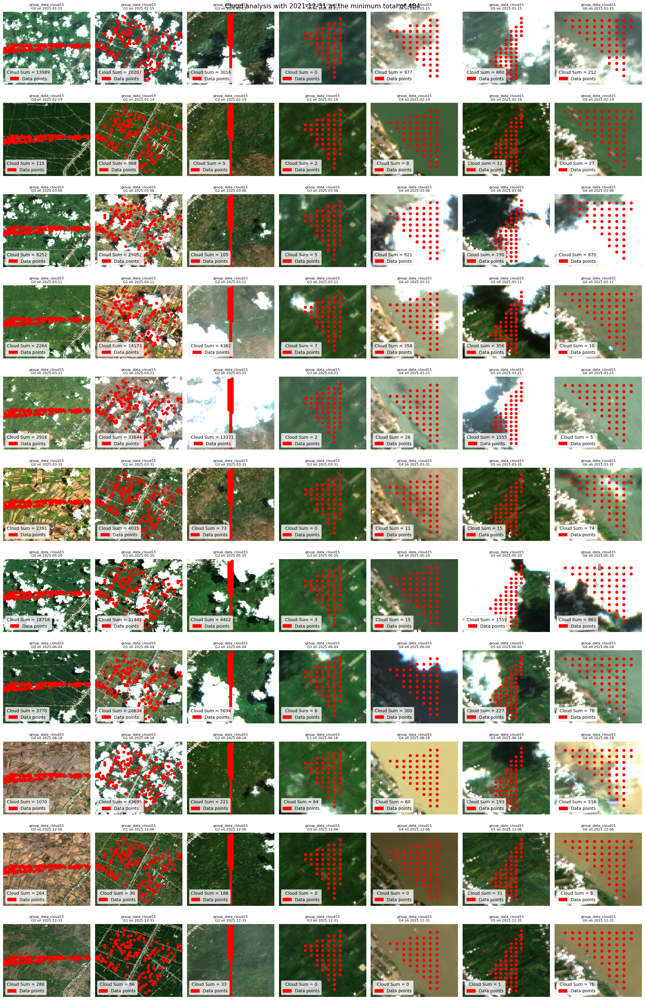

In [ ]:
data = l1_data_loader()

no_of_groups = data['grouping'].nunique()
# outputfile =  f"Cloud_cover_{month}.png"
folders = ['group_data_cloud15/SENTINEL-2-L2A']

plot_cloud_cover(folders,data,no_of_groups)

#### Data for Inference
(Inspect for reference only (Data are downloaded as features used in inference))

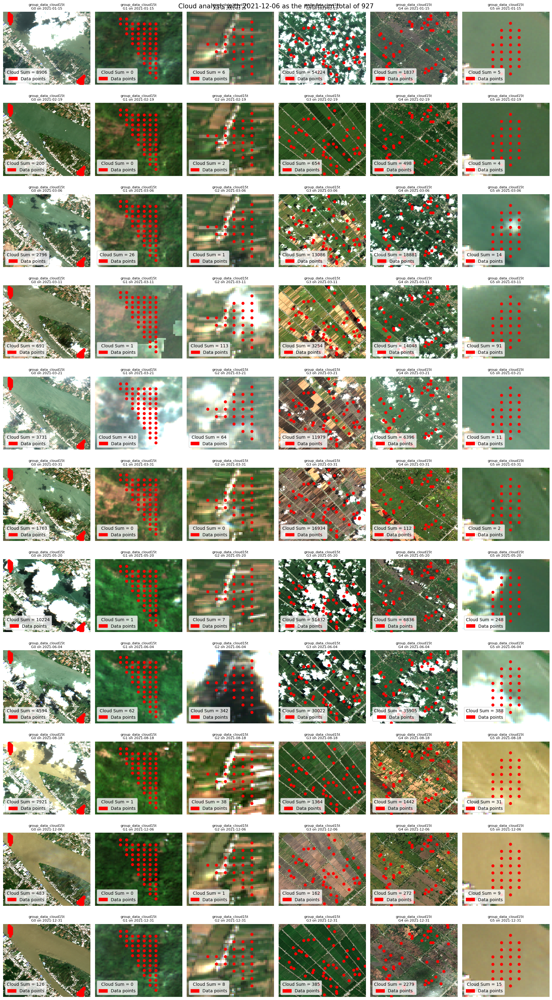

In [ ]:
temp = l1_template_loader()

no_of_groups = temp['grouping'].nunique()
# outputfile =  f"Cloud_cover_{month}.png"
folders = ['group_data_cloud15t/SENTINEL-2-L2A']

plot_cloud_cover(folders,temp,no_of_groups)